Images in the `DeepFluoro` dataset come with ground truth camera poses.
By sampling simulated X-rays around the true pose, we can visualize the
loss landscapes that we will have to optimize.

The metrics we try are

- Mean Absolute Error
- Mean Squared Error
- Peak Signal-to-Noise Ratio
- Structural Similarity Index Measure (SSIM)
- Normalized Cross Correlation
- Gradient Normalized Cross Correlation

If you want to try your own image similarity metric, implement it as a `torchmetrics` subclass.

In [ ]:
#| code-fold: true
import matplotlib.pyplot as plt
import numpy as np
import seaborn
import torch
from diffdrr.drr import DRR
from diffdrr.utils import convert
from torchmetrics import MeanAbsoluteError, MeanSquaredError, MetricCollection
from torchmetrics.image import (
    MultiScaleStructuralSimilarityIndexMeasure,
    PeakSignalNoiseRatio,
    StructuralSimilarityIndexMeasure,
)
from torchvision.transforms.functional import center_crop, resize
from tqdm import tqdm

from diffpose.deepfluoro import DeepFluoroDataset, Transforms
from diffpose.metrics import (
    GradientNormalizedCrossCorrelation,
    MultiscaleNormalizedCrossCorrelation,
    NormalizedCrossCorrelation,
)


class Simulator(torch.nn.Module):
    def __init__(self, id_number, idx, subsample=8, **deep_fluoro_kwargs):
        super().__init__()
        self.specimen = DeepFluoroDataset(id_number, **deep_fluoro_kwargs)
        self.drr = self.setup_diffdrr(self.specimen, subsample)
        self.transforms = Transforms(size=self.height)

        true_xray, pose = self.specimen[idx]
        true_xray = self.transforms(true_xray)
        self.true_xray = true_xray.cuda()

        self.rotations = convert(
            pose.get_rotation(), "matrix", "euler_angles", None, "ZYX"
        ).cuda()
        self.translations = pose.get_translation().cuda()

    def setup_diffdrr(self, specimen, subsample):
        self.height = (1536 - 100) // subsample
        dx = 0.194 * subsample
        sdr = specimen.focal_len / 2
        return DRR(
            specimen.volume,
            specimen.spacing,
            sdr=sdr,
            height=self.height,
            delx=dx,
            x0=specimen.x0,
            y0=specimen.y0,
            reverse_x_axis=True,
            bone_attenuation_multiplier=2.5,
        ).cuda()

    def forward(
        self, rotations_offset=[0.0, 0.0, 0.0], translations_offset=[0.0, 0.0, 0.0]
    ):
        rotations = self.rotations + torch.tensor([rotations_offset]).cuda()
        translations = self.translations + torch.tensor([translations_offset]).cuda()
        pred_xray = self.drr(
            rotations, translations, parameterization="euler_angles", convention="ZYX"
        )
        pred_xray = self.transforms(pred_xray)
        return pred_xray, self.true_xray

In [ ]:
simulator = Simulator(6, idx=1)
metrics = MetricCollection(
    {
        "MAE": MeanAbsoluteError(),
        "MSE": MeanSquaredError(),
        "PSNR": PeakSignalNoiseRatio(),
        "SSIM": StructuralSimilarityIndexMeasure(),
        "mSSIM": MultiScaleStructuralSimilarityIndexMeasure(),
        "NCC": NormalizedCrossCorrelation(),
        "LNCC": NormalizedCrossCorrelation(patch_size=13),
        "mNCC": MultiscaleNormalizedCrossCorrelation(
            patch_sizes=[13, None], patch_weights=[0.5, 0.5]
        ),
        "GNCC": GradientNormalizedCrossCorrelation(),
    }
).cuda()


def get_metrics(theta, phi, gamma, bx, by, bz):
    x, y = simulator([theta, phi, gamma], [bx, by, bz])
    m = metrics(x, y)
    return [v.item() for v in m.values()]

We search over a large capture range to visualize local minima:

- Angular: ± 1 rad
- Translation: ± 100 mm

In [ ]:
# NCC for the angles
step = 0.025
t_angles = torch.arange(-1, 1.01, step=step)
p_angles = torch.arange(-1, 1.01, step=step)
g_angles = torch.arange(-1, 1.01, step=step)

# Get coordinate-wise correlations
tp_corrs = []
for t in tqdm(t_angles, ncols=50):
    for p in p_angles:
        xcorr = get_metrics(t, p, 0, 0, 0, 0)
        tp_corrs.append(xcorr)
TP = torch.tensor(tp_corrs).reshape(len(t_angles), len(p_angles), -1)

tg_corrs = []
for t in tqdm(t_angles, ncols=50):
    for g in g_angles:
        xcorr = get_metrics(t, 0, g, 0, 0, 0)
        tg_corrs.append(xcorr)
TG = torch.tensor(tg_corrs).reshape(len(t_angles), len(g_angles), -1)

pg_corrs = []
for p in tqdm(p_angles, ncols=50):
    for g in g_angles:
        xcorr = get_metrics(0, p, g, 0, 0, 0)
        pg_corrs.append(xcorr)
PG = torch.tensor(pg_corrs).reshape(len(p_angles), len(g_angles), -1)

100%|█████████████| 81/81 [03:22<00:00,  2.50s/it]


In [ ]:
# NCC for the angles
step *= 100
xs = torch.arange(-100, 101, step=step)
ys = torch.arange(-100, 101, step=step)
zs = torch.arange(-100, 101, step=step)

# Get coordinate-wise correlations
xy_corrs = []
for x in tqdm(xs, ncols=50):
    for y in ys:
        xcorr = get_metrics(0, 0, 0, x, y, 0)
        xy_corrs.append(xcorr)
XY = torch.tensor(xy_corrs).reshape(len(xs), len(ys), -1)

xz_corrs = []
for x in tqdm(xs, ncols=50):
    for z in zs:
        xcorr = get_metrics(0, 0, 0, x, 0, z)
        xz_corrs.append(xcorr)
XZ = torch.tensor(xz_corrs).reshape(len(xs), len(zs), -1)

yz_corrs = []
for y in tqdm(ys, ncols=50):
    for z in zs:
        xcorr = get_metrics(0, 0, 0, 0, y, z)
        yz_corrs.append(xcorr)
YZ = torch.tensor(yz_corrs).reshape(len(ys), len(zs), -1)

100%|█████████████| 81/81 [03:20<00:00,  2.47s/it]


## Plots and takeaways

- Normalized Cross Correlation (Global NCC) appears to be the smoothest loss landscape
- Local NCC (Local NCC) has the sharpest peak at the optimum, but has low gradients far from the optimum
- Multiscale NCC (mNCC) achieves a good tradeoff between NCC and LNCC
- Gradient NCC (Gradient NCC) is also peaked at the optimum, but has a difficult landscape further away
- MAE, MSE, PSNR, SSIM, and mSSIM are inferior to NCC variants

In [ ]:
#| code-fold: true
seaborn.set_theme(context="notebook", style="ticks")


def plot(idx, zmin=None, zmax=None):
    if idx == 2 or idx == 3:
        multiplier = -1
    else:
        multiplier = 1

    ### 3D
    fig = plt.figure(figsize=(10, 6.5), dpi=300)
    axs = []

    # Angles
    xyx, xyy = torch.meshgrid(t_angles, p_angles, indexing="ij")
    xzx, xzz = torch.meshgrid(t_angles, g_angles, indexing="ij")
    yzy, yzz = torch.meshgrid(p_angles, g_angles, indexing="ij")

    ax = fig.add_subplot(2, 3, 1, projection="3d")
    ax.contourf(
        xyx.numpy(),
        xyy.numpy(),
        multiplier * TP[..., idx].numpy(),
        zdir="z",
        offset=(multiplier * TP[..., idx]).min(),
        cmap=plt.get_cmap("rainbow"),
        alpha=0.5,
    )
    ax.plot_surface(
        xyx.numpy(),
        xyy.numpy(),
        multiplier * TP[..., idx].numpy(),
        rstride=1,
        cstride=1,
        cmap=plt.get_cmap("rainbow"),
        linewidth=0.0,
    )
    ax.set_xlabel("Δα (radians)")
    ax.set_ylabel("Δβ (radians)")
    ax.set_zlim3d(zmin, zmax)
    axs.append(ax)

    ax = fig.add_subplot(2, 3, 2, projection="3d")
    plt.title(
        [
            "Gradient NCC",
            "Local NCC",
            "-MAE",
            "-MSE",
            "Global NCC",
            "PSNR",
            "SSIM",
            "mNCC",
            "mSSIM",
        ][idx]
    )
    ax.contourf(
        xzx.numpy(),
        xzz.numpy(),
        multiplier * TG[..., idx].numpy(),
        zdir="z",
        offset=(multiplier * TG[..., idx]).min(),
        cmap=plt.get_cmap("rainbow"),
        alpha=0.5,
    )
    ax.plot_surface(
        xzx.numpy(),
        xzz.numpy(),
        multiplier * TG[..., idx].numpy(),
        rstride=1,
        cstride=1,
        cmap=plt.get_cmap("rainbow"),
        linewidth=0.0,
    )
    ax.set_xlabel("Δα (radians)")
    ax.set_ylabel("Δγ (radians)")
    ax.set_zlim3d(zmin, zmax)
    axs.append(ax)

    ax = fig.add_subplot(2, 3, 3, projection="3d")
    ax.contourf(
        yzy.numpy(),
        yzz.numpy(),
        multiplier * PG[..., idx].numpy(),
        zdir="z",
        offset=(multiplier * PG[..., idx]).min(),
        cmap=plt.get_cmap("rainbow"),
        alpha=0.5,
    )
    ax.plot_surface(
        yzy.numpy(),
        yzz.numpy(),
        multiplier * PG[..., idx].numpy(),
        rstride=1,
        cstride=1,
        cmap=plt.get_cmap("rainbow"),
        linewidth=0.0,
    )
    ax.set_xlabel("Δβ (radians)")
    ax.set_ylabel("Δγ (radians)")
    ax.set_zlim3d(zmin, zmax)
    axs.append(ax)

    # Angles
    xyx, xyy = torch.meshgrid(xs, ys, indexing="ij")
    xzx, xzz = torch.meshgrid(xs, zs, indexing="ij")
    yzy, yzz = torch.meshgrid(ys, zs, indexing="ij")

    ax = fig.add_subplot(2, 3, 4, projection="3d")
    ax.contourf(
        xyx.numpy(),
        xyy.numpy(),
        multiplier * XY[..., idx],
        zdir="z",
        offset=(multiplier * XY[..., idx]).min(),
        cmap=plt.get_cmap("rainbow"),
        alpha=0.5,
    )
    ax.plot_surface(
        xyx.numpy(),
        xyy.numpy(),
        multiplier * XY[..., idx].numpy(),
        rstride=1,
        cstride=1,
        cmap=plt.get_cmap("rainbow"),
        linewidth=0.0,
    )
    ax.set_xlabel("ΔX (mm)")
    ax.set_ylabel("ΔY (mm)")
    ax.set_zlim3d(zmin, zmax)
    axs.append(ax)

    ax = fig.add_subplot(2, 3, 5, projection="3d")
    ax.contourf(
        xzx.numpy(),
        xzz.numpy(),
        multiplier * XZ[..., idx].numpy(),
        zdir="z",
        offset=(multiplier * XZ[..., idx]).min(),
        cmap=plt.get_cmap("rainbow"),
        alpha=0.5,
    )
    ax.plot_surface(
        xzx.numpy(),
        xzz.numpy(),
        multiplier * XZ[..., idx].numpy(),
        rstride=1,
        cstride=1,
        cmap=plt.get_cmap("rainbow"),
        linewidth=0.0,
    )
    ax.set_xlabel("ΔX (mm)")
    ax.set_ylabel("ΔZ (mm)")
    ax.set_zlim3d(zmin, zmax)
    axs.append(ax)

    ax = fig.add_subplot(2, 3, 6, projection="3d")
    ax.contourf(
        yzy.numpy(),
        yzz.numpy(),
        multiplier * YZ[..., idx].numpy(),
        zdir="z",
        offset=(multiplier * YZ[..., idx]).min(),
        cmap=plt.get_cmap("rainbow"),
        alpha=0.5,
    )
    ax.plot_surface(
        yzy.numpy(),
        yzz.numpy(),
        multiplier * YZ[..., idx].numpy(),
        rstride=1,
        cstride=1,
        cmap=plt.get_cmap("rainbow"),
        linewidth=0.0,
    )
    ax.set_xlabel("ΔY (mm)")
    ax.set_ylabel("ΔZ (mm)")
    ax.set_zlim3d(zmin, zmax)
    axs.append(ax)

    return fig, axs

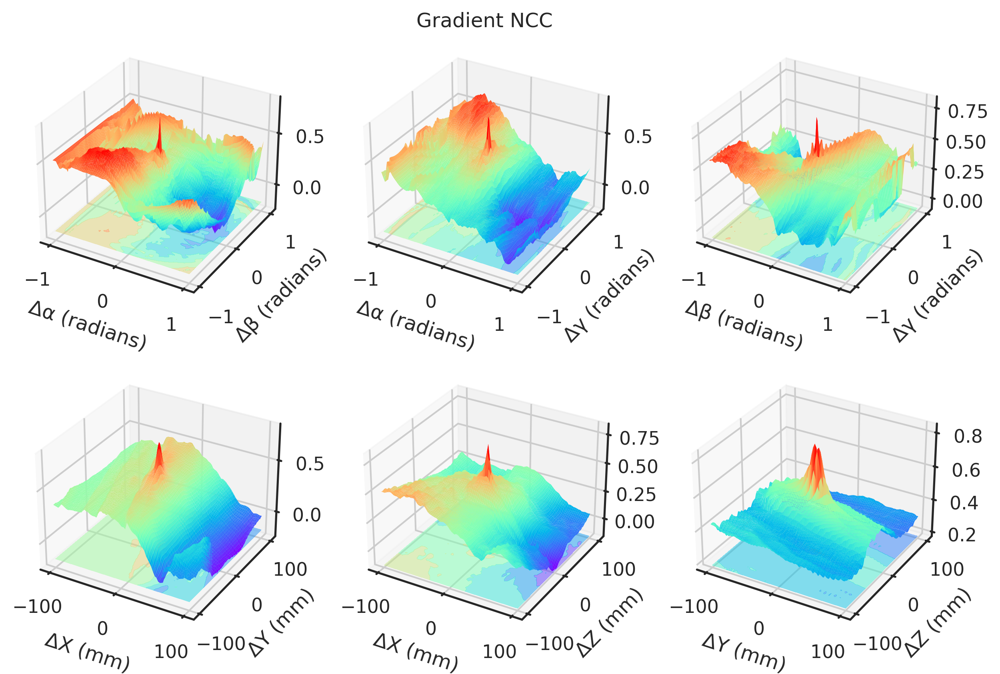

In [ ]:
plot(0)
plt.show()

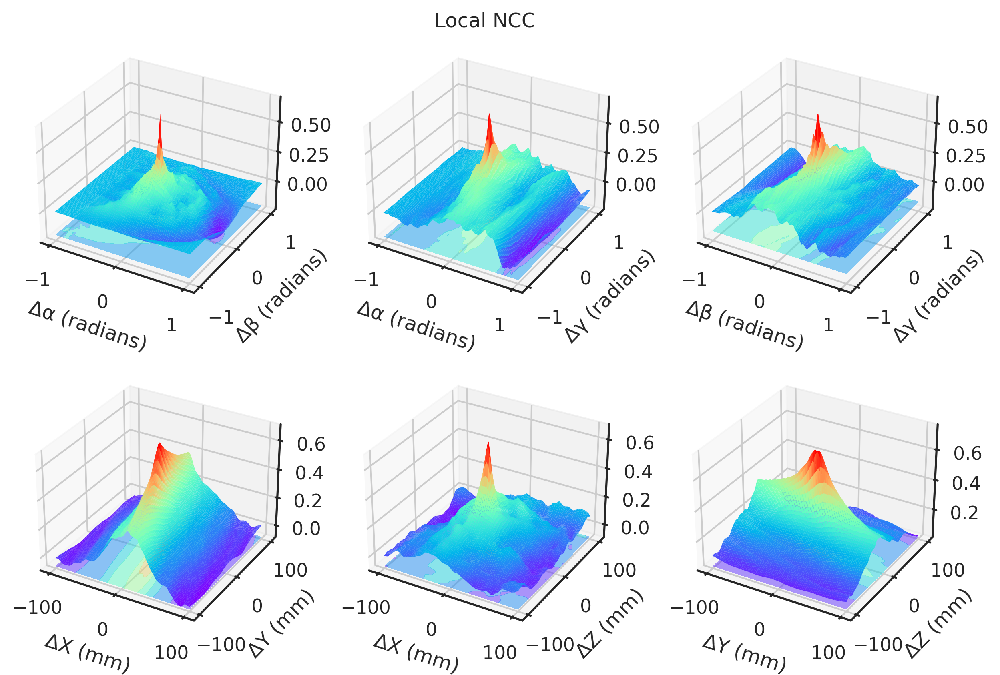

In [ ]:
plot(1)
plt.show()

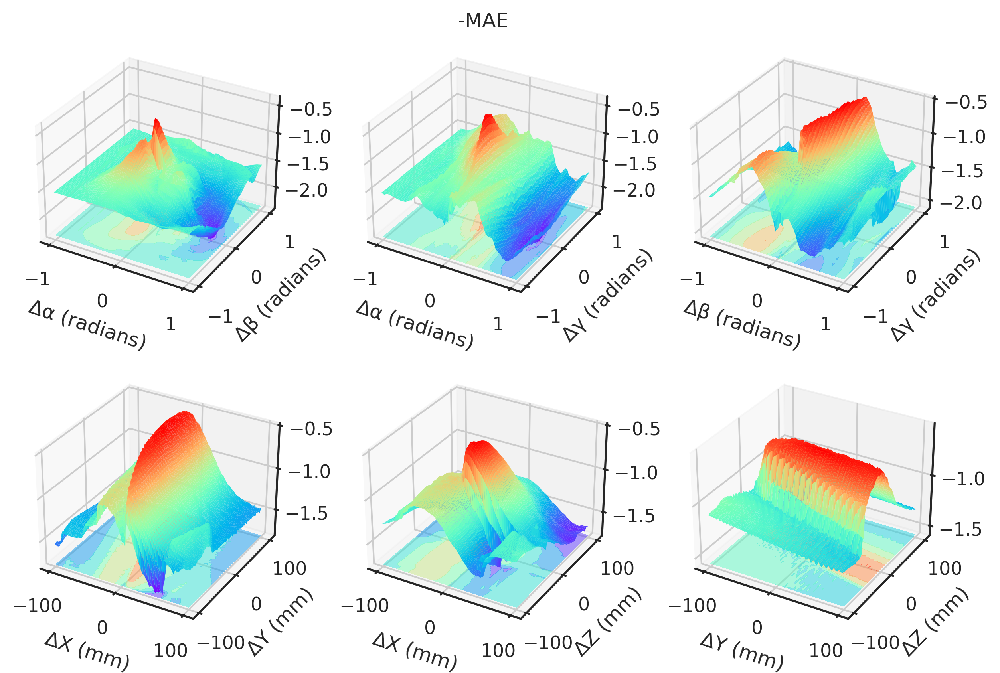

In [ ]:
plot(2)
plt.show()

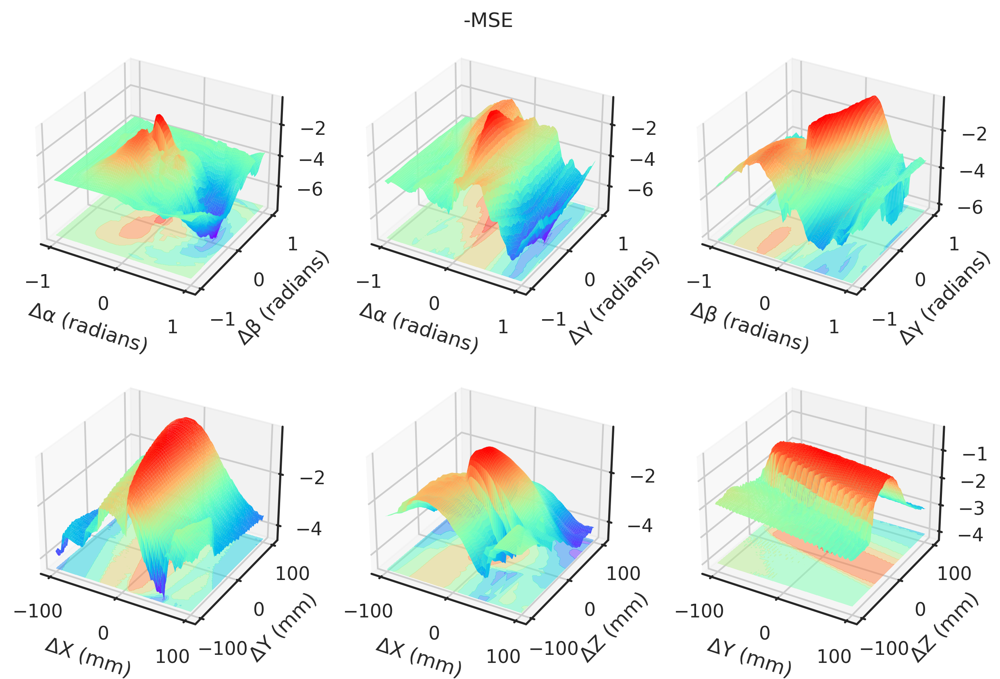

In [ ]:
plot(3)
plt.show()

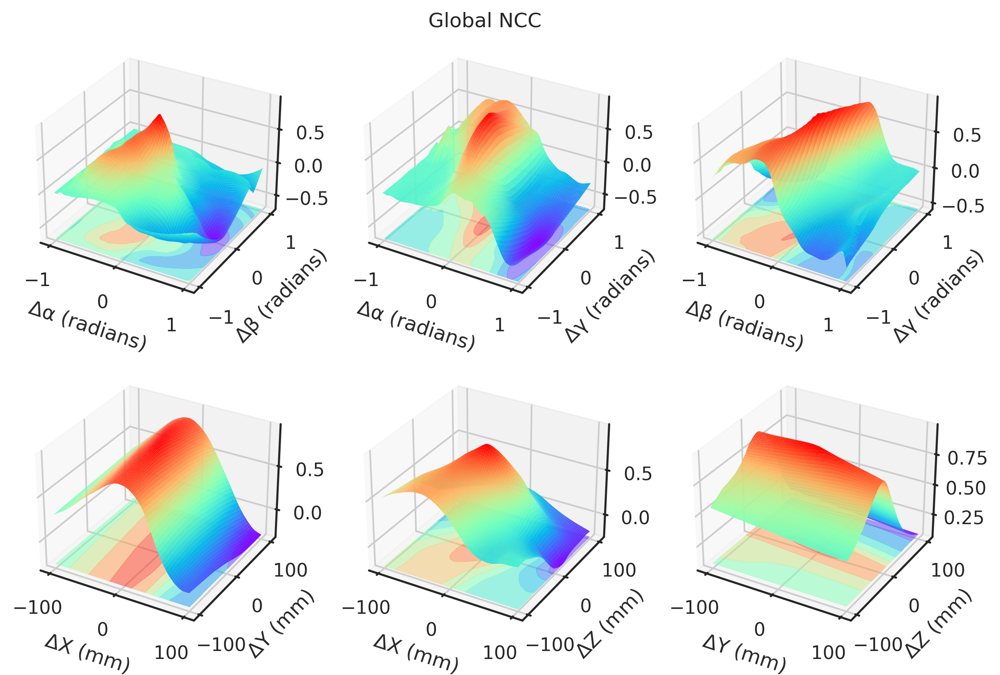

In [ ]:
plot(4)
plt.show()

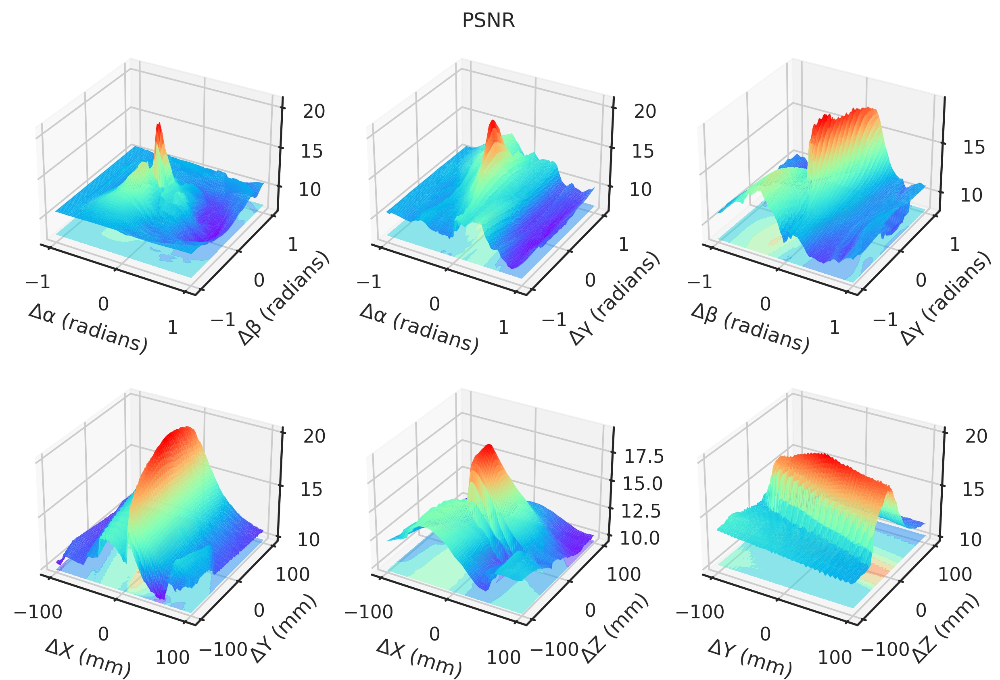

In [ ]:
plot(5)
plt.show()

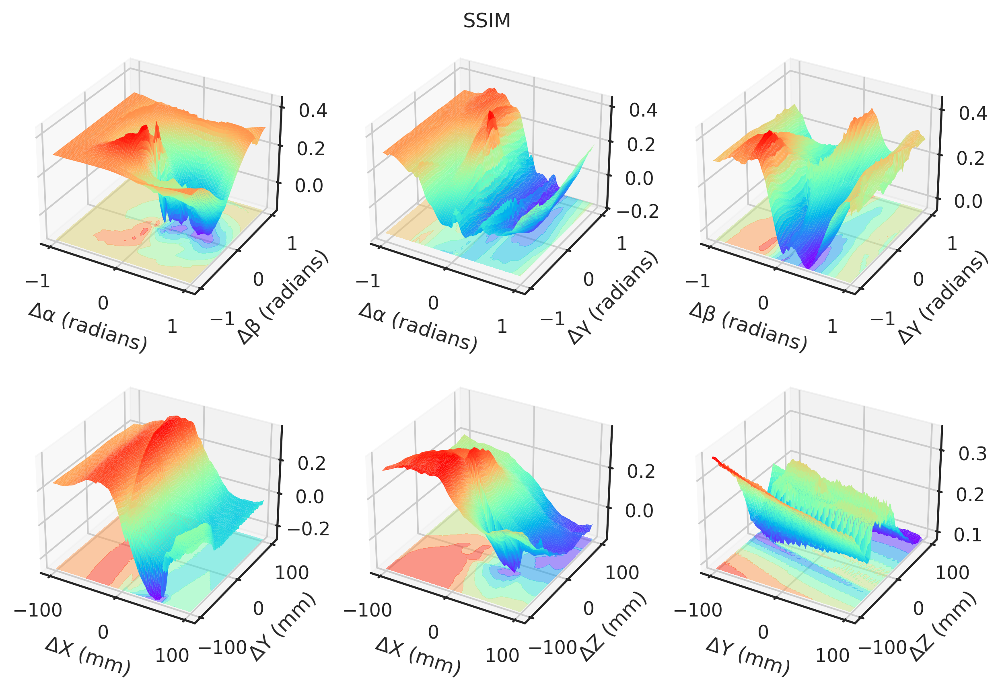

In [ ]:
plot(6)
plt.show()

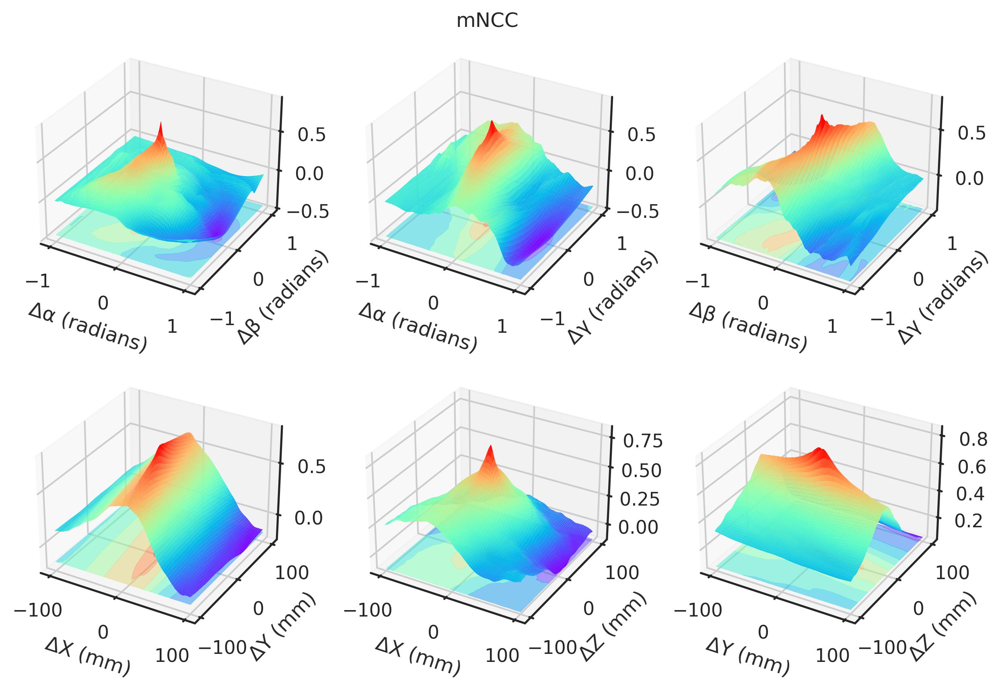

In [ ]:
plot(7)
plt.show()

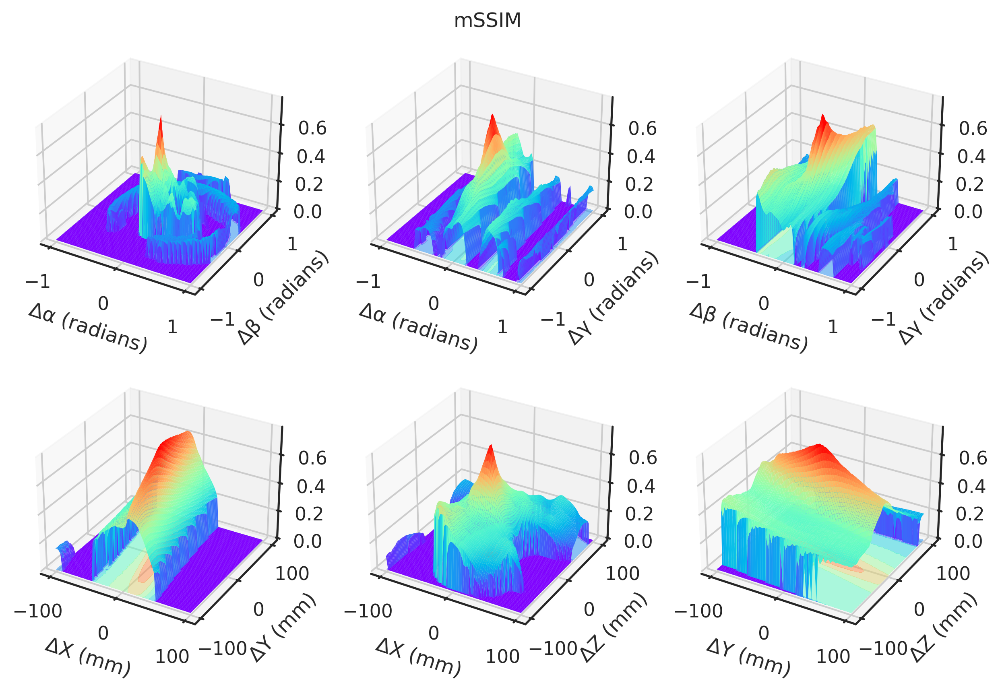

In [ ]:
plot(8)
plt.show()